In [2]:
%matplotlib inline
 
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import sys
import seaborn as sns
import time
from requests import get
import json
import datetime
import matplotlib
#matplotlib.use('TkAgg')
 
from matplotlib import rcParams
rcParams['figure.figsize'] = (12, 6)
rcParams['figure.dpi'] = 150
rcParams['font.size'] = 16
rcParams['font.family'] = 'sans-serif'
rcParams['axes.facecolor'] = '#ffffff'  
rcParams['lines.linewidth'] = 2.0


from IPython.display import HTML



In [3]:
 
# latitude, longitude,bedroom_number,property_type
data = pd.read_csv('C:/KhalidH/NG_20190204.csv',parse_dates=True)
               
data = data.drop_duplicates(subset=['property_type' ,'latitude', 'longitude','post_code','bedroom_number','price'])
#data.to_csv("C:/KhalidH/NG/NG1_master.csv",index=False, encoding='utf-8', mode='w', header=True)
#https://www.ritchieng.com/machine-learning-project-boston-home-prices/

print('Number of records in the dataset:',len(data))
#data.drop('Unnamed: 0', axis=1, inplace=True)


Number of records in the dataset: 6828


In [4]:


df = data

In [5]:
try:
    data.drop(columns=['Unnamed: 0'], inplace=True)
    data.drop(columns=['Unnamed: 0.1'], inplace=True)
except:
    pass


In [6]:
import folium  
%pwd


'C:\\Users\\KhalidH'

In [7]:
def plot_station_counts(df):
    # generate a new map
    folium_map = folium.Map(location=[52.9548, -1.1581],
                            zoom_start=13,
                            tiles="OpenStreetMap",
                            width='100%')

    # for each row in the data, add a cicle marker
    for index, row in df.iterrows():
        # calculate net departures
        price = int((row["price"]/1000))
        
        # generate the popup message that is shown on click.
        #popup_text = "{}<br> total departures: {}<br> total arrivals: {}<br> net departures: {}"
        #popup_text = popup_text.format(row["Start Station Name"],
                    #      row["Arrival Count"],
                    #row["Departure Count"],
                       #   net_departures)
        popup_text = "<br>Type:{} <br>Rooms:{} <br>Price:{}K"
        popup_text = popup_text.format(row["property_type"],row["bedroom_number"],price)
                  
        # radius of circles
        #radius = net_departures/20
        
        # choose the color of the marker
        #if net_departures>0:
            # color="#FFCE00" # orange
            # color="#007849" # green
            #color="#E37222" # tangerine
        #else:
            # color="#0375B4" # blue
            # color="#FFCE00" # yellow            
        color="#008000" # teal
        
        # add marker to the map
        folium.CircleMarker(location=(row["latitude"],
                                      row["longitude"]),
                            radius=7,
                            color=color,
                            popup=popup_text,
                            fill=True).add_to(folium_map)
    return folium_map

In [8]:
plot_station_counts(df)
                    

In [9]:
folium_map = folium.Map(location=[52.952850, -1.158697],
                        zoom_start=13,
                        )

marker = folium.CircleMarker(location=[52.952850, -1.158697])
marker.add_to(folium_map)
folium_map

location = [51.507351, -0.127758]
marker =   folium.CircleMarker(location=([52.952850,-1.158697]),
                        radius=3,
                        color="#0A8A9F",
                        tiles="OpenStreetMap",
                        fill=True).add_to(folium_map)
marker.add_to(folium_map)
folium_map 

In [10]:
#data.columns

print('Data is for the following postcodes')
print(data['post_code'].dropna().unique())

Data is for the following postcodes
['NG1' 'NG2' 'NG3' 'NG4' 'NG5' 'NG6' 'NG7' 'NG8' 'NG9' 'NG10' 'NG11'
 'NG12' 'NG13' 'NG14' 'NG15']


In [11]:
#values = 'Town house','End terrace house', 'Maisonette', 'Studio', 'Detached house','Detached bungalow', 'Bungalow', 'Semi-detached bungalow','Terraced bungalow'
data = data.loc[data['property_type'].isin(['Semi-detached house', 'Flat', 'Terraced house','Town house','End terrace house', 'Maisonette', 'Studio', 'Detached house','Detached bungalow', 'Bungalow', 'Semi-detached bungalow','Terraced bungalow'])]

data = data[(data['price'] != 0)]
print('Property types are:',data['property_type'].unique())

Property types are: ['Semi-detached house' 'Flat' 'Terraced house' 'End terrace house'
 'Town house' 'Maisonette' 'Studio' 'Detached house' 'Detached bungalow'
 'Bungalow' 'Terraced bungalow' 'Semi-detached bungalow']


In [12]:
data['todays_date'] = pd.to_datetime(datetime.datetime.today().strftime('%Y-%m-%d'))
data['A'] = pd.to_datetime(data['todays_date']).dt.date
data['B'] = pd.to_datetime(data['first_published_date']).dt.date
data['updated_in_days'] = (data['A'] - data['B']).dt.days

rent = data[data['listing_status'] == 'rent']
sale = data[data['listing_status'] == 'sale']

rent.loc[:, "weekly_price"] =  rent['price']
rent.loc[:, "price"] = (rent['weekly_price'] * 52 / 12) 
#rent['price'] = rent.apply(lambda row: row['weekly_price'] * 52 /12, axis=1)
#rent.loc[:,'weekly_price'] = rent['price']
#rent['price'] = rent['weekly_price'] * 52 / 12 # monthly rent




C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [13]:
dataset_new =(data[(data['B'] == data['A']) &  (data['listing_status'] == 'rent')])
print('Properties listed today for rent')
dataset_new[['property_type','price', 'first_published_date','bedroom_number','post_code']]


Properties listed today for rent


,property_type,price,first_published_date,bedroom_number,post_code


In [14]:

#data.drop_duplicates(subset=None, keep='first', inplace=False)



In [15]:
#Block = sale[sale['property_type'] == 'Block of flats'] 
#Block[['first_published_date','last_published_date','street_name','bedroom_number','price','agent_name','post_code']].dropna()

#data.columns


In [16]:
def missig_data(data_frame):

    data = data_frame
    total = data.isnull().sum().sort_values(ascending=False)
    percent = (data.isnull().sum()/data.isnull().count()).sort_values(ascending=False)
    missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
    return missing_data


                                   

In [17]:
#sale = sale[~sale['title'].str.contains('DN')]
#rent = rent[~rent['title'].str.contains('DN')]
#print('rent missing data')
#print(missig_data(rent).head(10))
#print('\nsale missing data')
#print(missig_data(sale).head(10))


Text(0.5, 1.0, 'Properties for rent')

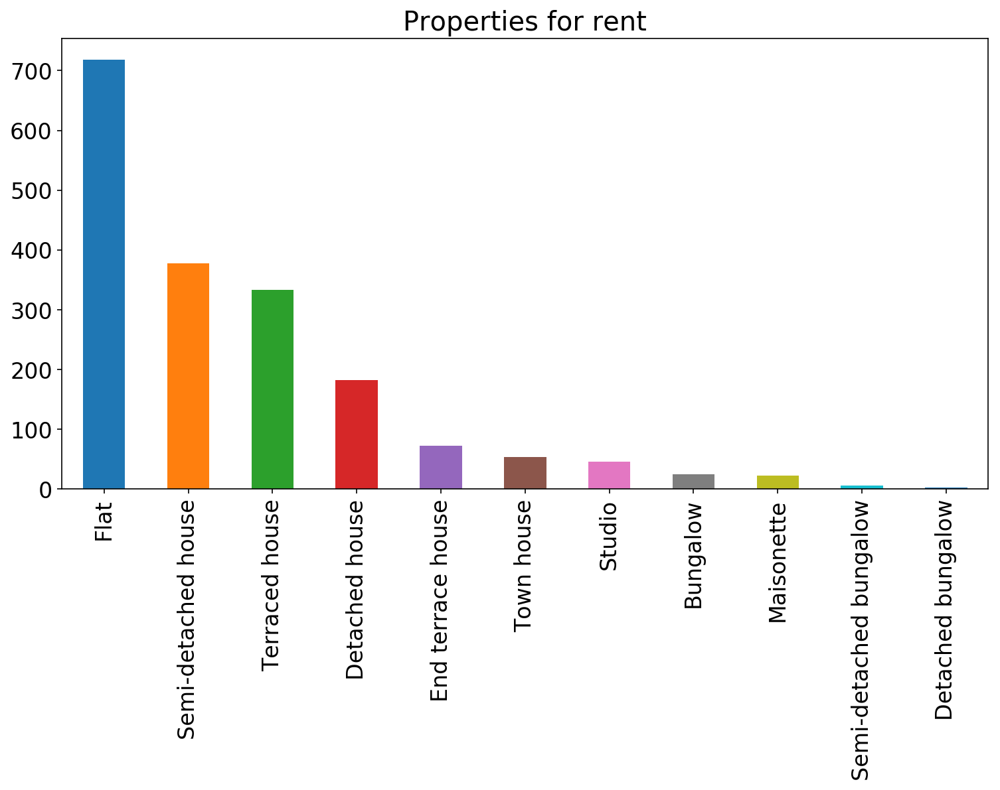

In [18]:
ax = rent["property_type"].value_counts().plot(x='property_type', kind='bar')
ax.set_title("Properties for rent")

Text(0.5, 1.0, 'Properties for sale')

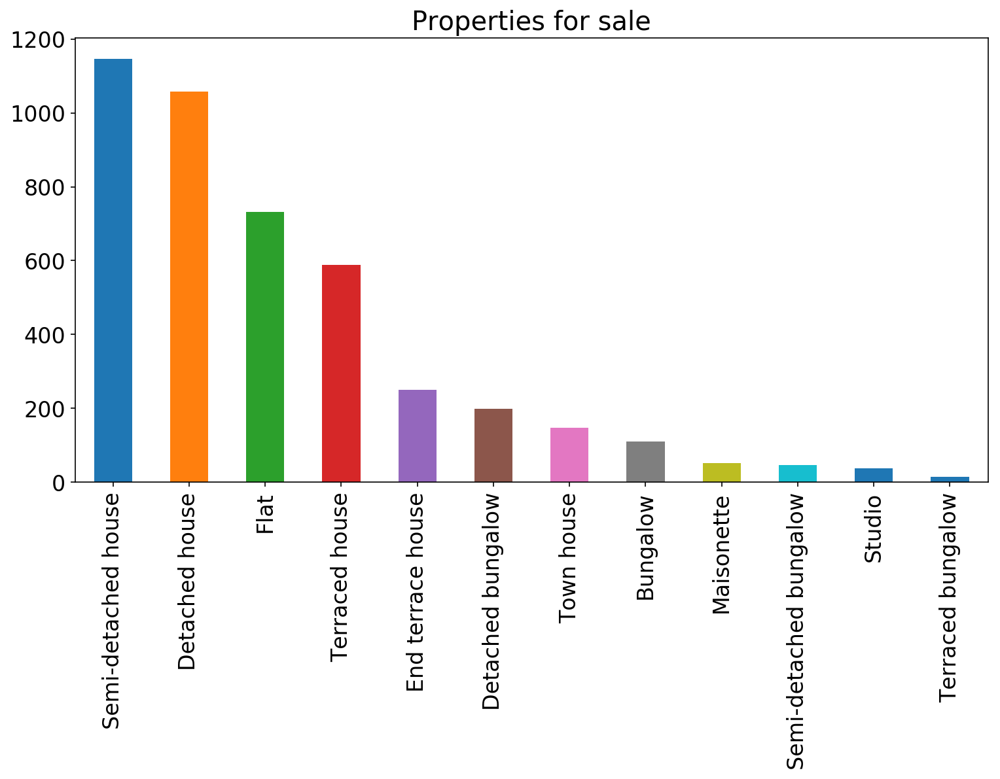

In [19]:
ax = sale["property_type"].value_counts().plot(x='property_type', kind='bar')
ax.set_title("Properties for sale")

Text(0.5, 1.0, 'Rent cost by postcode')

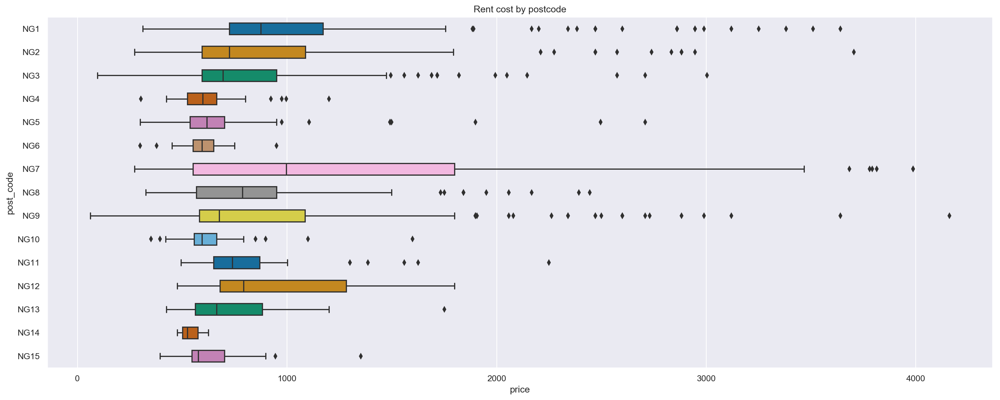

In [32]:

bplot=sns.boxplot(y='post_code', x='price', 
                 data=rent, 
                 width=0.5,
                 palette="colorblind")
plt.rcParams['figure.figsize']=(20,20)

bplot.set_title("Rent cost by postcode")



Text(0.5, 1.0, 'Sale price by postcode')

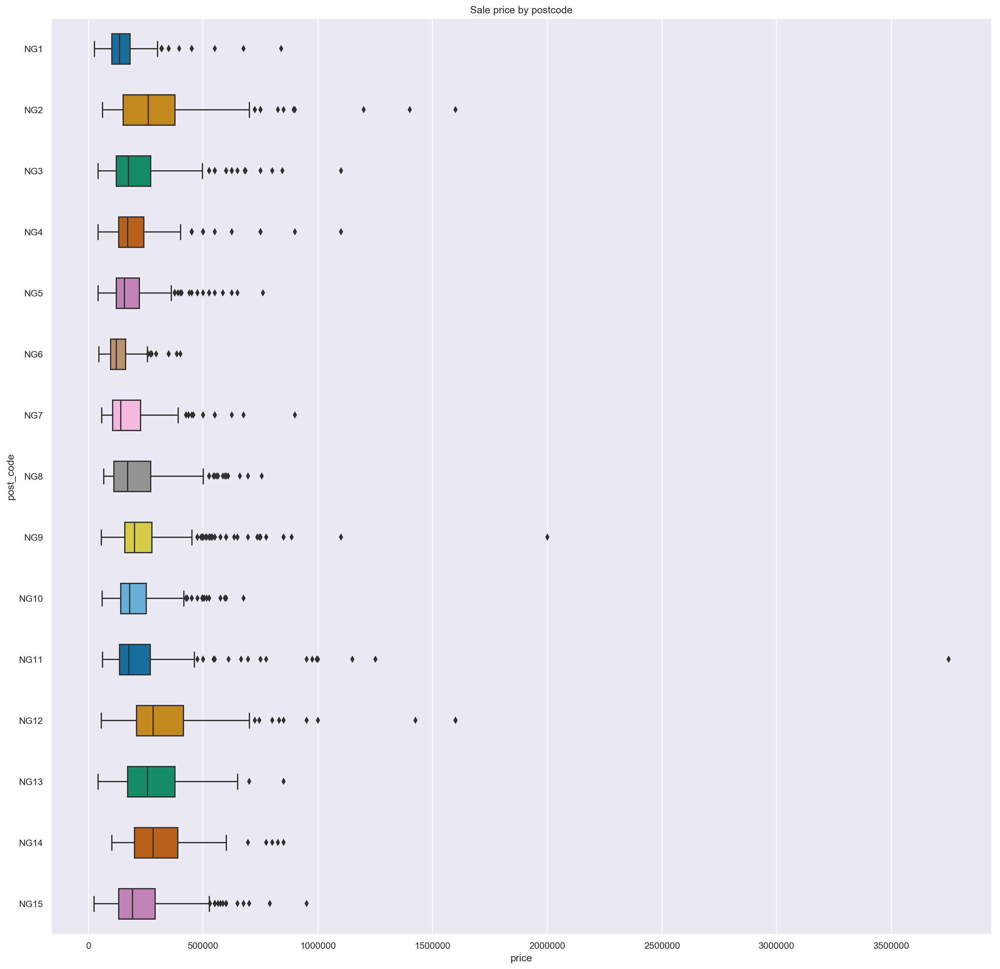

In [33]:
bplot=sns.boxplot(y='post_code', x='price', 
                 data=sale, 
                 width=0.5,
                 palette="colorblind")
plt.rcParams['figure.figsize']=(20,20)
bplot.set_title("Sale price by postcode")

In [22]:
#sale = sale[~sale['post_code'].str.contains('DN')]
rent.dropna()
rent_house = rent[rent['property_type'].str.contains('house',case=False,na=False)]
rent_flat = rent[(rent.property_type == 'Flat')]
#rent_house['price'].dropna()
sale_house = sale[sale['property_type'].str.contains('house',case=False,na=False)]
sale_flat = sale[(sale.property_type == 'Flat')]


C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\figure.py:445: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  % get_backend())


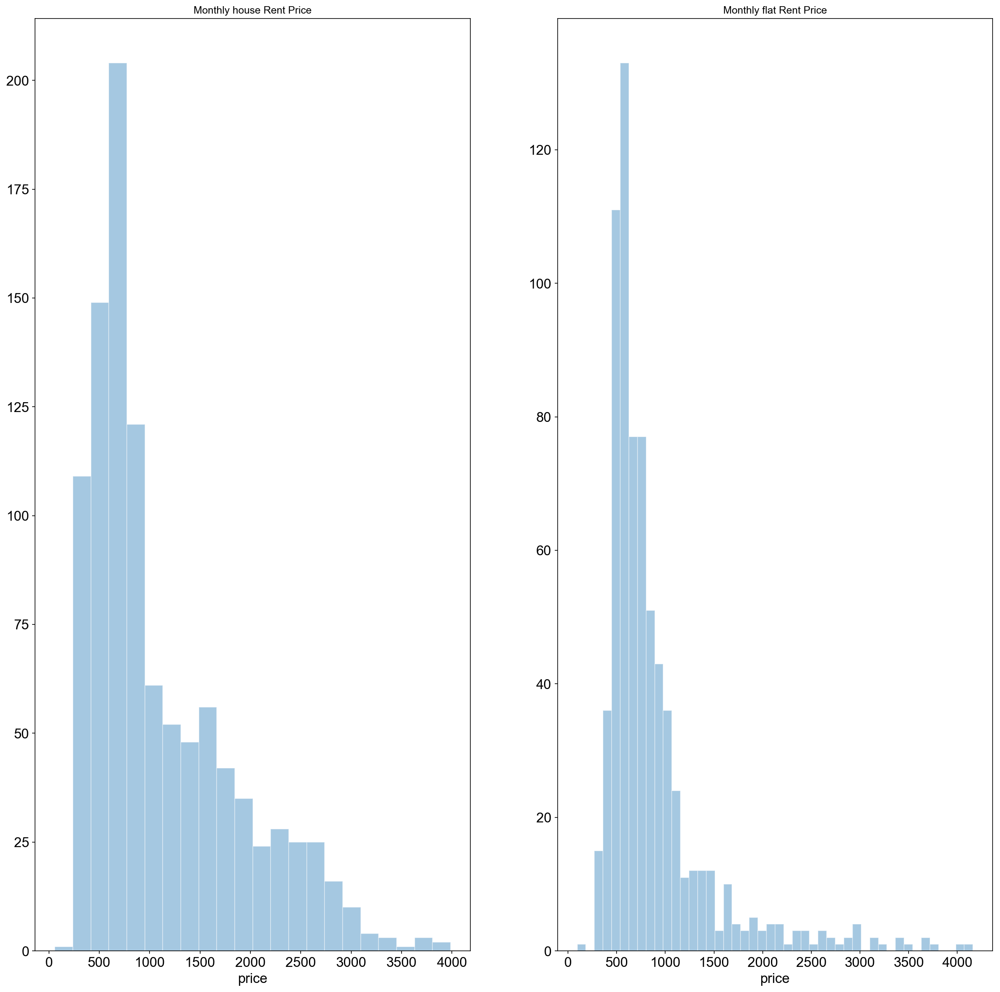

In [23]:
fig, ax =plt.subplots(1,2)
sns.set(rc={'figure.figsize':(21.7,8.27)})
ax[0].set_title("Monthly house Rent Price")
ax[1].set_title("Monthly flat Rent Price")

sns.distplot(rent_house['price'].dropna(),hist=True,kde=False,norm_hist=False,ax=ax[0])
sns.distplot(rent_flat['price'].dropna(),hist=True,kde=False,norm_hist=False,ax=ax[1])

fig.show()

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\figure.py:445: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  % get_backend())


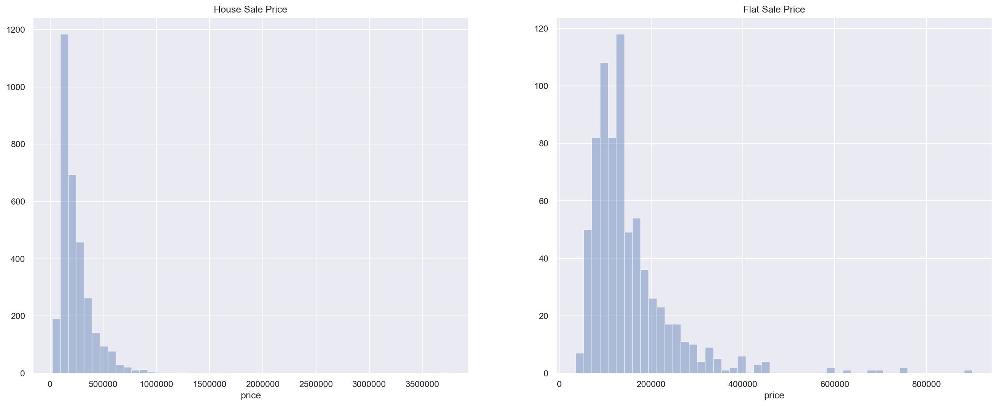

In [24]:
fig, ax =plt.subplots(1,2)
sns.set(rc={'figure.figsize':(21.7,8.27)})
ax[0].set_title("House Sale Price")
ax[1].set_title("Flat Sale Price")
sns.distplot(sale_house['price'].astype(float).dropna(),hist=True,kde=False,norm_hist=False,ax=ax[0])
sns.distplot(sale_flat['price'].astype(float).dropna(),hist=True,kde=False,norm_hist=False,ax=ax[1])

fig.show()

In [25]:
print('Rented property stats for number of days the property has been on the market \n')
market = rent.groupby(['property_type','post_code'])['updated_in_days'].describe().dropna().reset_index()
market[market['count'] > 5]

Rented property stats for number of days the property has been on the market 



,property_type,post_code,count,mean,std,min,25%,50%,75%,max
2,Bungalow,NG8,9.0,486.333333,485.715452,131.0,137.00,155.0,548.00,1289.0
3,Bungalow,NG9,6.0,198.833333,77.762244,129.0,147.75,177.5,218.50,339.0
6,Detached house,NG10,8.0,153.500000,31.158581,117.0,132.00,150.5,166.75,213.0
10,Detached house,NG15,7.0,148.857143,29.689665,117.0,124.00,142.0,174.50,186.0
11,Detached house,NG2,20.0,195.200000,76.228604,119.0,142.50,168.5,225.75,424.0
12,Detached house,NG3,10.0,156.300000,50.031212,119.0,131.00,134.0,158.25,275.0
14,Detached house,NG5,9.0,162.000000,39.137578,127.0,128.00,134.0,192.00,226.0
15,Detached house,NG7,72.0,204.569444,188.959480,117.0,134.75,175.5,212.00,1286.0
16,Detached house,NG8,23.0,171.304348,40.527695,120.0,136.00,173.0,204.00,233.0
17,Detached house,NG9,14.0,191.285714,49.062642,122.0,152.75,195.5,210.75,311.0


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\figure.py:445: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  % get_backend())


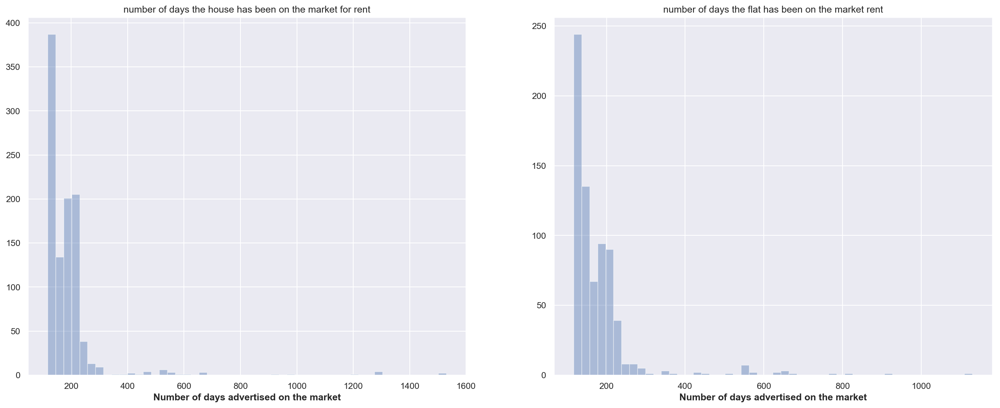

In [26]:
fig, ax =plt.subplots(1,2)
sns.set(rc={'figure.figsize':(21.7,8.27)})

ax[0].set_title("number of days the house has been on the market for rent")
ax[1].set_title("number of days the flat has been on the market rent")

#ax[1].set_xlabel(xlabel ='Number of Days', fontweight='bold')
sns.distplot(rent_house['updated_in_days'],hist=True,kde=False,norm_hist=False,ax=ax[0])
ax[0].set_xlabel(xlabel='Number of days advertised on the market', fontweight='bold')
sns.distplot(rent_flat['updated_in_days'],hist=True,kde=False,norm_hist=False,ax=ax[1])
ax[1].set_xlabel(xlabel='Number of days advertised on the market', fontweight='bold')
fig.show()



updated_in_days is number of days advertised on the market (data extracted on 08-Jan-2019)

In [27]:
print("House rent cost:",rent_house['price'].describe())

print ("Number of days the house has been on the market:",rent_house['updated_in_days'].describe())

House rent cost: count    1019.000000
mean     1126.152110
std       727.672497
min        60.666667
25%       593.666667
50%       801.666667
75%      1516.666667
max      3986.666667
Name: price, dtype: float64
Number of days the house has been on the market: count    1019.000000
mean      189.237488
std       121.913052
min       117.000000
25%       135.000000
50%       173.000000
75%       208.000000
max      1530.000000
Name: updated_in_days, dtype: float64


Updated_in_days is number of days advertised on the market.

In [28]:
print("Flat rent cost:",rent_flat['price'].describe())

print("\nNumber of days the house has been on the market",rent_flat['updated_in_days'].describe())

Flat rent cost: count     718.000000
mean      875.134169
std       574.447122
min        95.333333
25%       550.333333
50%       693.333333
75%       952.250000
max      4160.000000
Name: price, dtype: float64

Number of days the house has been on the market count     718.000000
mean      179.518106
std        94.507335
min       117.000000
25%       133.250000
50%       150.000000
75%       198.000000
max      1130.000000
Name: updated_in_days, dtype: float64


In [29]:
rented = rent[['property_type','bedroom_number','price','post_code']]
rented = pd.DataFrame(rented.groupby(['property_type','bedroom_number','post_code'])['price'].agg(['median','mean','count']).reset_index())
rented = rented.rename(index=str, columns={"median": "median_rent","mean": "mean_rent","count": "count_rent" })


In [30]:
print('\n Top 15 median flat rent and count > 20 number of properties on rent')
rented[(rented['property_type'] == 'Flat') & (rented['count_rent'] > 20) ].sort_values(by=['median_rent'], ascending=False).head(15)


 Top 15 median flat rent and count > 20 number of properties on rent


,property_type,bedroom_number,post_code,median_rent,mean_rent,count_rent
136,Flat,3,NG7,1185.166667,1112.402778,24
115,Flat,2,NG1,912.166667,946.111111,78
126,Flat,2,NG7,823.333333,861.006803,98
121,Flat,2,NG2,693.333333,744.124031,43
122,Flat,2,NG3,676.000000,732.333333,29
101,Flat,1,NG1,637.000000,640.545455,44
128,Flat,2,NG9,624.000000,640.900000,40
124,Flat,2,NG5,593.666667,604.901235,27
107,Flat,1,NG2,550.333333,590.158730,21
112,Flat,1,NG7,524.333333,540.703704,54


In [31]:
print('\n Top 15 median house rent and count > 10 number of properties on rent')
data[(data['property_type'].str.contains('house'))].sort_values(by=['median_rent'], ascending=False).head(15)


 Top 15 median house rent and count > 10 number of properties on rent


KeyError: 'median_rent'

In [ ]:
on_sale = sale[['property_type','bedroom_number','price','post_code']]
on_sale = sale[['price']].astype(float)
on_sale = pd.DataFrame(sale.groupby(['property_type','bedroom_number','post_code'])['price'].agg(['median','mean','count']).reset_index())
on_sale = on_sale.rename(index=str, columns={"median": "median_sale","mean": "mean_sale","count": "count_sale" })


In [ ]:
#Gross Yield = Annual Rent / Property Value
result = pd.merge(rented, on_sale,  how='right', left_on=['property_type','bedroom_number','post_code'], right_on = ['property_type','bedroom_number','post_code'])
#result['post_code'].dropna()

result['annual_rent'] = result.median_rent * 12.0 

result['gross_yield'] = result.annual_rent.div(result.median_sale) * 100  

gross_yield = pd.DataFrame(result.groupby(['property_type','bedroom_number','post_code','count_rent','median_rent','median_sale'])['gross_yield'].agg(['median']).dropna().reset_index())

Median and average gross yield and count > 10 number of properties on rent

Top 20 listed below:

In [ ]:
print('\nMedian gross yield and count > 10 number of houses on rent')
print('\nTop 10 listed below:')
hse_gross_yield = gross_yield[gross_yield['property_type'].str.contains('house')]
hse_gross_yield[hse_gross_yield['count_rent'] > 10].sort_values(by=['median'], ascending=False).head(10)



In [ ]:
print('\nMedian gross yield and count > 10 number of falts on rent')
print('\nTop 10 listed below:')
hse_gross_yield = gross_yield[~gross_yield['property_type'].str.contains('house')]
hse_gross_yield[hse_gross_yield['count_rent'] > 10].sort_values(by=['median'], ascending=False).head(10)

In [ ]:
#sns.heatmap(result.corr(), annot=True, fmt=".2f")
#plt.show()

result['gross_yield_qcut_cat'] =  None
result['gross_yield_qcut_cat'] = pd.qcut(result['gross_yield'],20)


In [ ]:
# Convert target variable to categorical like low,medium,high and very high rent
result['rent_cat'] =  None
result.loc[result.median_rent <= 600,'rent_cat'] = 0
result.loc[(result.median_rent > 600 ) & (result.median_rent <= 800),'rent_cat'] = 1
result.loc[(result.median_rent > 800 ) & (result.median_rent <= 1000),'rent_cat'] = 2
result.loc[result.median_rent > 1000,'rent_cat'] = 3


Rent per month
low rent <= 600:
medium rent between 600 and 800:
high rent between 800 and 1000:
very high rent over 1000

In [ ]:
pd.crosstab([result.rent_cat],[result.property_type]).style.background_gradient(cmap='summer_r')


In [ ]:
pd.crosstab([result.rent_cat],[result.post_code]).style.background_gradient(cmap='summer_r')

Quantile based segregation which buckets the data in buckets of equal number of properties.

In [ ]:
pd.crosstab([result.gross_yield_qcut_cat],[result.post_code]).style.background_gradient(cmap='summer_r')

In [ ]:

#rent['property_type'][rent['property_type'].str.contains('house', case=False)] =  'house'
#rent['property_type'][rent['property_type'].str.contains('Studio', case=False)] =  'Flat'

#rent = rent[(rent['property_type'].str.contains('house', case=False)) | (rent['property_type'].str.contains('flat', case=False))]
#sns.lmplot(x="bedroom_number", y="price", hue="property_type", data=rent,markers=["o", "x"], palette="Set1");

#sns.lmplot(x="bedroom_number", y="price", hue="property_type", data=rent);
#rent['property_type'].unique()

In [ ]:
sns.regplot(x=sale_flat["bedroom_number"], y=sale_flat["price"], line_kws={"color":"r","alpha":0.7,"lw":5})

In [ ]:


import sklearn
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from patsy import dmatrices, dmatrix, demo_data
from sklearn import preprocessing
from sklearn.model_selection import KFold, cross_val_score, train_test_split


frames = [rent_house, rent_flat]
result = pd.concat(frames)

#min_max_scaler = preprocessing.MinMaxScaler()
#np_scaled = min_max_scaler.fit_transform(result)
#df_normalized = pd.DataFrame(np_scaled)
#df_normalized

#def reject_outliers(data, m = 2.):
#    d = np.abs(data - np.median(data))
#    mdev = np.median(d)
#    s = d/mdev if mdev else 0.
#   return data[s<m]

#result['price'] = reject_outliers(result['price'] )



In [ ]:

result = result[(result['property_type'] != 'Link-detached house') ]
y, X = dmatrices('price ~ property_type + post_code + bedroom_number + num_recepts + bathroom_number', data=result, return_type='dataframe')



mod = sm.OLS(y, X)  #Use the model class to describe the model
res = mod.fit() #Fit the model using a class method
res.summary()
#result = result[result['price'] > 0]
result['property_type'].unique()



In [ ]:
df = rent_flat[['property_type','price','bathroom_number','bedroom_number','post_code']]

df1 = df.apply(lambda x: x.factorize()[0])


In [ ]:
#X_train, X_test, Y_train, Y_test =  sklearn.model_selection.train_test_split(X, y, test_size = 0.33, random_state = 3)
X_train, X_test, Y_train, Y_test =  sklearn.model_selection.train_test_split(X, y, test_size = 0.4, random_state=101)
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)


In [ ]:

#Y_train,X_train= dmatrices("Y_train ~ X_train",df)
lm = LinearRegression()
lm.fit(X_train, Y_train)

Y_pred = lm.predict(X_test)
#plt.figure(figsize=(12,10)
plt.scatter(Y_test, Y_pred)

#plt.scatter(y_test, y_pred, color='blue')
#plt.plot(Y_test, Y_test, color='red', linewidth=2)
#plt.plot(Y_test,  Y_pred)
plt.xlabel("Prices: $Y_i$")
plt.ylabel("Predicted prices: $\hat{Y}_i$")
plt.title("Prices vs Predicted prices: $Y_i$ vs $\hat{Y}_i$")




In [ ]:
lm.score(X_test, Y_test)

In [ ]:
# regression coefficients 
print('Coefficients: \n', lm.coef_) 
# variance score: 1 means perfect prediction 
print('Variance score: {}'.format(lm.score(X_test, Y_test))) 

# plot for residual error 

## setting plot style 
plt.style.use('fivethirtyeight') 

## plotting residual errors in training data 
plt.scatter(lm.predict(X_train), lm.predict(X_train) - Y_train, color = "green", s = 10, label = 'Train data')


In [ ]:
## plotting residual errors in test data 
plt.scatter(lm.predict(X_test), lm.predict(X_test) - Y_test, 
            color = "blue", s = 10, label = 'Test data') 

In [ ]:
mse = sklearn.metrics.mean_squared_error(Y_test, Y_pred)
print(mse)

In [ ]:
from sklearn import ensemble
clf = ensemble.GradientBoostingRegressor(n_estimators = 1000, max_depth = 5, min_samples_split = 2,
          learning_rate = 0.01, loss = 'huber')


In [ ]:
GBoost_agr = ensemble.GradientBoostingRegressor(n_estimators=1000, 
                                   learning_rate=0.01,
                                  max_depth=9, 
                                  max_features='sqrt',
                                 min_samples_leaf=10, 
                                  min_samples_split=5, 
                                  loss='huber', 
                                 random_state =5)

# Fit the model to the training data
GBoost_agr.fit(X_train, Y_train)
y_pred=GBoost_agr.predict(X_test) 
GBoost_agr.score(X_test,Y_test)


In [ ]:
clf.fit(X_train, Y_train)

In [ ]:
y_pred=clf.predict(X_test) 
clf.score(X_test,Y_test)

In [ ]:
plt.scatter(Y_test, Y_pred)

#plt.scatter(y_test, y_pred, color='blue')
plt.plot(Y_test, Y_test, color='red', linewidth=2)
#plt.plot(Y_test,  Y_pred)
plt.xlabel("Prices: $Y_i$")
plt.ylabel("Predicted prices: $\hat{Y}_i$")
plt.title("Prices vs Predicted prices: $Y_i$ vs $\hat{Y}_i$")

In [ ]:
print (lm)
print (lm.coef_)
print (lm.intercept_)
